---

$$\text{MODEL SELECTION AND OPTIMIZATION}$$

---

In this Notebook we will apply the same pipeline as in notebook [3.MachineLearning](3.MachineLearning) but try to optimize both the binary classifier model and the multilabel classifier. The optimization is done by a hyperparameter tunning using a bayesian search and trying differente models. For sake of speed, since we will train the model hundreds of times, we just use gradiant boosting algorithms here as they present promessing results with low training times.

In this notebook most of the data cleaning and pre-processing is done using [data_processing.py](../pipeline/lib/data_processing.py) functions, so not all code is explicite.


    1. Binary Classifier
        1.1 Model Selection
        1.2 Bayesian Hyperparameter tunning
    2. K-Fold Prediction
    3. Multiclass Classifier
        3.1 Model Selection
        3.2 Bayesian Hyperparameter tunning
        3.3 Evaluation

In [1]:
import pandas as pd
import numpy as np
import pickle

import sys
sys.path.insert(1, '../pipeline/lib')
import utils, data_processing

from sklearn.metrics import confusion_matrix, f1_score, accuracy_score

import lightgbm as lgb
from catboost import Pool, CatBoostClassifier
import xgboost as xgb

from sklearn.metrics import roc_curve, roc_auc_score

import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)


In [2]:
path = '../../data/train-validation/training-data.csv'

df = pd.read_csv(path, index_col = 0)
id_ = 'Identificador_Agricultor'

categorical  = ['Tipo_de_Cultivo','Tipo_de_Solo','Categoria_Pesticida', 'Temporada']
categorical_index = [df.drop(columns = [id_]).columns.get_loc(col)
                     for col in categorical ] 
drop_columns = ['dano_na_plantacao_binario', 'dano_na_plantacao', 'Identificador_Agricultor']

# Binary Classifier

## Model Selection

Here we are preparing 3 different models for the binary prediction - **XGBoost**, **CatBoost** and **LightGBM**, this models can deal with data in different ways, **CatBoost** classifier can deal with categorical features, so for the **CatBoost** training data we are not applying OneHotEncoder. For the **LightGBM** classifier we are not upsampling the data since we can use the parameter `is_unbalance` to deal with unbalanced classes, and for **XGBoost** we apply OneHotEncoder and SMOTE upsampling and downsampling.

In [3]:
parameters =  []


parameters += [{'model': xgb.XGBClassifier,
                'model_kwargs':{'objective':'binary:logistic',
                                'tree_method': 'gpu_hist',
                                'n_estimators' : 1000,
                                'subsample' : 0.4,
                                'colsample_bytree' : 0.8, 
                                'learning_rate' : 0.0001},
                'fit_kwargs':{},
                'data_processing_kwargs': {},
                'upsample_kwargs':{'upsample_type' : 'SMOTE',
                                  'over_sampling' : 0.5,
                                  'under_sampling': 0.8}}]

parameters += [{'model': CatBoostClassifier,
                'model_kwargs':{'iterations':1000,
                                'task_type':"GPU",
                                'devices':'0:1'},
                'fit_kwargs':{'verbose':0,
                              'cat_features':categorical_index},
                'data_processing_kwargs':{'apply_ohe':False},
                'upsample_kwargs':{'upsample_type' : 'SMOTE',
                                   'over_sampling' : 0.5,
                                   'under_sampling': 0.8}}]

parameters += [{'model': lgb.LGBMClassifier,
               'model_kwargs':{'is_unbalance': True,
                               'silent':True},
               'fit_kwargs':{},
               'data_processing_kwargs':{},
               'upsample_kwargs':{}}]

For each model we can plot precision x recall curve, this way we can select a model with high true positives and try to minimize the false positives.

In [4]:

models = []
training_sets = []

for i, p in enumerate(parameters):
    
    print(f"\n=========  {p['model'].__name__} ===========\n")
    
    rd = data_processing.read_data(path, **p['data_processing_kwargs'])
    X, y = rd.drop(columns = drop_columns), rd['dano_na_plantacao_binario']

    training_sets.append(data_processing.train_test_sample(X, y, 0.2, **p['upsample_kwargs']))

    X_train, X_test,y_train, y_test = training_sets[-1]    

    models.append(p['model'](**p['model_kwargs']))

    models[-1].fit(X_train,  y_train, **p['fit_kwargs'])

    proba = models[-1].predict_proba(X_test)
    
    fig = utils.plot_precision_recall(y_test.map({0:0,1:1,2:1}), proba[:,1])
    fig.show()
    


=========  XGBClassifier ===========

Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features
SMOTE Upsample



=========  CatBoostClassifier ===========

Removing 5690 from Semanas_Utilizando 
SMOTE Upsample



=========  LGBMClassifier ===========

Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features


In [5]:

fig = go.Figure()

roc_results = []
for model, training_set in zip(models,training_sets):

    X_train, X_test,y_train, y_test = training_set
    proba = model.predict_proba(X_test)
    roc_results.append(roc_curve(y_test, proba[:,1]))
    lr_fpr, lr_tpr, threshold = roc_results[-1]
    fig.add_trace(go.Scatter(x = lr_fpr, y = lr_tpr,
                             name = model.__class__.__name__,
                             hovertemplate = '<b>%{text}</b>',
                             text =threshold ) )
fig.update_layout(title = 'ROC Curve')
fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.show()

There is no significant differente between the models when chosing a high Positive Rate Threshold. Here we can choose a threshold value with 95% positive rate and approximatly 70% False Positive Rate. This means we have 30% True Negative Rate, so when we move to the multiclass predictor we already removed 30% form the majoroty class.

In [6]:
# Desired False Positive Rate
d_tpr = 0.95
thresholds = []
for model, rr in zip(models,roc_results):
    lr_fpr, lr_tpr, threshold = rr
    index = utils.arg_nearest(lr_tpr,d_tpr)
    thresholds = threshold[index]
    print(model.__class__.__name__,':')
    print(f'Threshold: {threshold[index]:.3}', )
    print(f'False Positive Rate: {lr_fpr[index]:.3}' )
    print(f'True Positive Rate: {lr_tpr[index]:.3}\n')


XGBClassifier :
Threshold: 0.468
False Positive Rate: 0.696
True Positive Rate: 0.95

CatBoostClassifier :
Threshold: 0.136
False Positive Rate: 0.706
True Positive Rate: 0.95

LGBMClassifier :
Threshold: 0.199
False Positive Rate: 0.672
True Positive Rate: 0.95



## Model Optimization

Here we are going to optimize our model to **minimize the False Positive Rate** while keeping the true positive rate at 80%, this way we can try to guarantee most of our majority class as True Negative.

We can chose to keep the Positive Rate at 80% by using the threshold that leads to that value.

**Hyperopt** uses a Bayesian approach, compared with GridSeach which is a brute-force approach or RandomSearch which is purely random,  Bayesian Optimization combines randsomness adn posterior probability distribution in searching the optimal parameters.

In [7]:
from hyperopt import hp
import hyperopt.pyll
from hyperopt.pyll import scope
from hyperopt import STATUS_OK

param_hyperopt = {
    # XGBOOST Parameters --- SMALL DIFFERENCE
    'max_depth':scope.int(hp.quniform('max_depth', 5, 16, 1)),
    'n_estimators':scope.int(hp.quniform('n_estimators', 5, 1000, 1)),
    'min_child_weight':  scope.int(hp.quniform('min_child_weight', 1, 8, 1)),
    'reg_lambda':hp.uniform('reg_lambda', 0.01, 500.0),
    'reg_alpha':hp.uniform('reg_alpha', 0.01, 500.0),
    'colsample_bytree':hp.uniform('colsample_bytree', 0.3, 0.8),
                 }

def cost_function(params):
    
    clf = xgb.XGBClassifier(**params,
                            objective="binary:logistic",
                            random_state=42)
    
    clf.fit(X_train, y_train)
    proba = clf.predict_proba(X_test)
    
    desired_positive_rate = 0.8
    lr_fpr, lr_tpr, thresholds = roc_curve(y_test, proba[:,1])
    index = utils.arg_nearest(lr_tpr, desired_positive_rate)
                                           
    return {'loss':lr_fpr[index],'status': STATUS_OK}
                                    

In [8]:
from hyperopt import fmin, tpe, Trials
num_eval = 100

X_train, X_test,y_train, y_test = training_sets[0]

trials = Trials()
best_param = fmin(cost_function,
                     param_hyperopt,
                     algo=tpe.suggest,
                     max_evals=num_eval,
                     trials=trials,
                     rstate=np.random.RandomState(1))

100%|██████████| 100/100 [03:01<00:00,  1.81s/trial, best loss: 0.376649638143891] 


In [9]:
best_param['max_depth'] = int(best_param['max_depth'] )
best_param['min_child_weight'] = int(best_param['min_child_weight'] )
best_param['n_estimators'] = int(best_param['n_estimators'] )

# K fold prediction

In [10]:
rd = data_processing.read_data(path)
X, y, y_multi = rd.drop(columns = drop_columns), rd['dano_na_plantacao_binario'], rd['dano_na_plantacao'] 

prob_predictions = data_processing.k_fold_prediction(X, y, 5, xgb.XGBClassifier, best_param, {}, {'over_sampling' : 0.5,'under_sampling': 0.8})

Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features
1/5: TRAIN: 44800 - TEST: 11200 
Training Model ...
Predicting ...

2/5: TRAIN: 44800 - TEST: 11200 
Training Model ...
Predicting ...

3/5: TRAIN: 44800 - TEST: 11200 
Training Model ...
Predicting ...

4/5: TRAIN: 44800 - TEST: 11200 
Training Model ...
Predicting ...

5/5: TRAIN: 44800 - TEST: 11200 
Training Model ...
Predicting ...

Done!


In [11]:
d_tpr = 0.95

roc_result = roc_curve(y, prob_predictions)
lr_fpr, lr_tpr, thresholds = roc_result
index = utils.arg_nearest(lr_tpr,d_tpr)
binary_thrashold = thresholds[index]

In [12]:
# Save Parameters

model_paramters = {'reg_paramters':best_param,'threshold':binary_thrashold}

with open('../models/binary_classfier_parameters.pkl', 'wb') as file:
    pickle.dump(model_paramters, file)

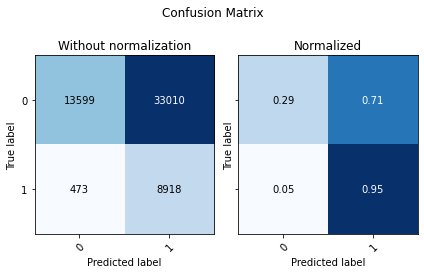

,Accuracy,F1 Score Weighted,ROC AUC
0,0.402089,0.397882,0.782583


In [13]:
binary_predictions = (prob_predictions > binary_thrashold).astype(int) 
utils.Evaluate(y, binary_predictions, prob_predictions, ['0','1'])

# Multiclass Classifier
## Model Selection


In [14]:
parameters =  []

parameters += [{'model': xgb.XGBClassifier,
                'model_kwargs':{'objective':'bjective=multi:softmax',
                                'tree_method': 'gpu_hist',
                                'n_estimators' : 1000,
                                'subsample' : 0.4,
                                'colsample_bytree' : 0.8, 
                                'learning_rate' : 0.0001},
                'fit_kwargs':{},
                'data_processing_kwargs': {},
                'upsample_kwargs':{'upsample_type' : 'SMOTE',
                                   'over_sampling' : 'not majority',
                                   'under_sampling': 'not minority'}}]

parameters += [{'model': CatBoostClassifier,
                'model_kwargs':{'iterations':1000,
                                'task_type':"GPU",
                                'devices':'0:1',
                                'loss_function':'MultiClass'},
                'fit_kwargs':{'verbose':0,
                              'cat_features':categorical_index},
                'data_processing_kwargs':{'apply_ohe':False},
                'upsample_kwargs':{'upsample_type' : 'SMOTE',
                                   'over_sampling' : 'not majority',
                                   'under_sampling': 'not minority'}}]

parameters += [{'model': lgb.LGBMClassifier,
               'model_kwargs':{'class_weight': {0:1.43, 1:5.01283, 2:18.857},
                               'silent':False},
               'fit_kwargs':{},
               'data_processing_kwargs':{},
               'upsample_kwargs':{}}]


=========  XGBClassifier ===========

Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features
SMOTE Upsample


,value counts
2,26413
1,26413
0,26413


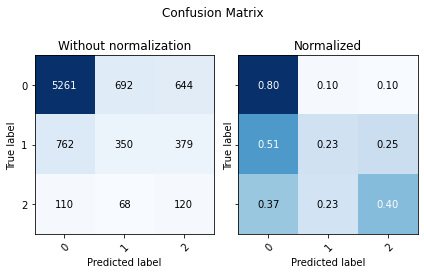

,Accuracy,F1 Score Weighted,ROC AUC
0,0.683401,0.420743,0.722598



=========  CatBoostClassifier ===========

Removing 5690 from Semanas_Utilizando 
SMOTE Upsample


,value counts
2,26395
1,26395
0,26395


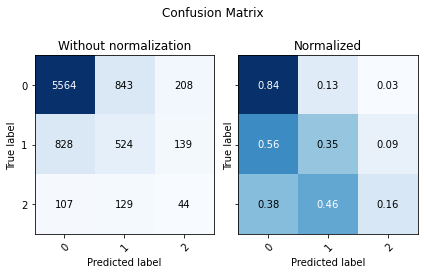

,Accuracy,F1 Score Weighted,ROC AUC
0,0.731219,0.44352,0.728067



=========  LGBMClassifier ===========

Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features


,value counts
0,26448
1,5958
2,1136


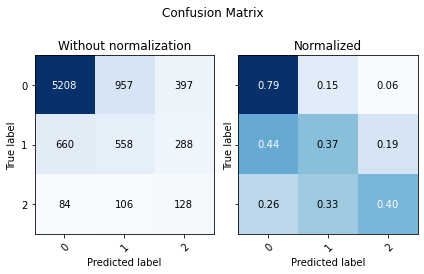

,Accuracy,F1 Score Weighted,ROC AUC
0,0.702838,0.471863,0.767619


In [15]:
models = []
training_sets = []

threshold = 0.5

for i, p in enumerate(parameters):
    
    print(f"\n=========  {p['model'].__name__} ===========\n")
    
    rd = data_processing.read_data(path, **p['data_processing_kwargs'])
    X, y = rd.drop(columns = drop_columns), rd['dano_na_plantacao']
    X_p, y_p = X[binary_predictions == 1], y[binary_predictions == 1]
    X_n, y_n = X[binary_predictions == 0], y[binary_predictions == 0]
    
    training_sets.append(data_processing.train_test_sample(X_p, y_p, 0.2, **p['upsample_kwargs']))
    X_train, X_test,y_train, y_test = training_sets[-1]
    display(y_train.value_counts().to_frame().rename(columns = {'dano_na_plantacao':'value counts'}))

    models.append(p['model'](**p['model_kwargs']))

    models[-1].fit(X_train,  y_train, **p['fit_kwargs'])

    proba = models[-1].predict_proba(X_test)
    
    display(utils.Evaluate(y_test, np.argmax(proba, axis =1), proba, ['0','1','2']))
    

In [16]:
param_hyperopt = {
        'w1':hp.uniform('w1', 0.8,  1.2),
        'w2':hp.uniform('w2', 3.0,  5.0),
        'w3':hp.uniform('w3', 5.0, 15.0)
                 }

def cost_function(params):
    
    w1 = params['w1']
    w2 = params['w2']
    w3 = params['w3']
    
    clf = lgb.LGBMClassifier(class_weight = {0:w1, 1:w2, 2:w3}, silent=True)
    
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    f1_weighted = f1_score(y_test, y_pred,
                           average = 'macro')
                                           
    return {'loss':-f1_weighted,
            'status': STATUS_OK}

num_eval = 100

X_train, X_test,y_train, y_test = training_sets[-1]

trials = Trials()
best_param_multi = fmin(cost_function,
                     param_hyperopt,
                     algo=tpe.suggest,
                     max_evals=num_eval,
                     trials=trials,
                     rstate=np.random.RandomState(1))

with open('../models/multiclass_classfier_parameters.pkl', 'wb') as file:
    pickle.dump(best_param_multi, file)
        
best_param_multi

100%|██████████| 100/100 [01:27<00:00,  1.15trial/s, best loss: -0.48312761364261797]


{'w1': 1.0407164799032167, 'w2': 3.193438079637253, 'w3': 11.497179282036987}

## Evaluation

In [17]:
rd = data_processing.read_data(path)
X, y = rd.drop(columns = drop_columns), rd['dano_na_plantacao']
X['binary_predictions'] = binary_predictions

training_set = data_processing.train_test_sample(X, y, 0.2)
X_train, X_test ,y_train, y_test = training_set
                                           
X_train_p = X_train[X_train['binary_predictions'] == 1].drop(columns = ['binary_predictions'])
y_train_p = y_train[X_train['binary_predictions'] == 1]

X_test_p  =  X_test[X_test['binary_predictions'] == 1].drop(columns = ['binary_predictions'])
y_test_p  =  y_test[X_test['binary_predictions'] == 1]
X_test_n  =  X_test[X_test['binary_predictions'] == 0].drop(columns = ['binary_predictions'])
y_test_n  =  y_test[X_test['binary_predictions'] == 0]


Removing 5690 from Semanas_Utilizando 
Applying OneHotEncoder on categorical features


In [18]:
w1 = best_param_multi['w1']
w2 = best_param_multi['w2']
w3 = best_param_multi['w3']

clf = lgb.LGBMClassifier(class_weight = {0:w1, 1:w2, 2:w3}, silent=True)
clf.fit(X_train_p, y_train_p)
y_pred_p = clf.predict(X_test_p)

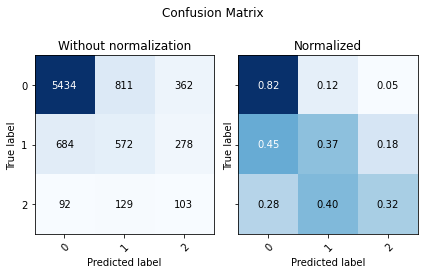

In [19]:
cm = confusion_matrix(y_test_p, y_pred_p)
utils.plot_confusion_matrix(cm, ['0','1','2'])

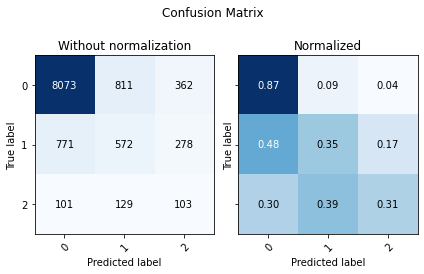

F1 Score Macro: 0.4813922711825676
Accuracy Score: 0.7810714285714285


In [20]:

y_predictions = pd.Series(index = y_test.index, dtype = np.float64)
y_predictions[X_test['binary_predictions'] == 1] = y_pred_p
y_predictions[X_test['binary_predictions'] == 0] = 0

cm = confusion_matrix(y_test, y_predictions)
utils.plot_confusion_matrix(cm, ['0','1','2'])
print('F1 Score Macro:', f1_score(y_test, y_predictions, average='macro'))
print('Accuracy Score:',accuracy_score(y_test, y_predictions))